# Air Quality Prediction using Hierarchical Clustering and ANN Architecture
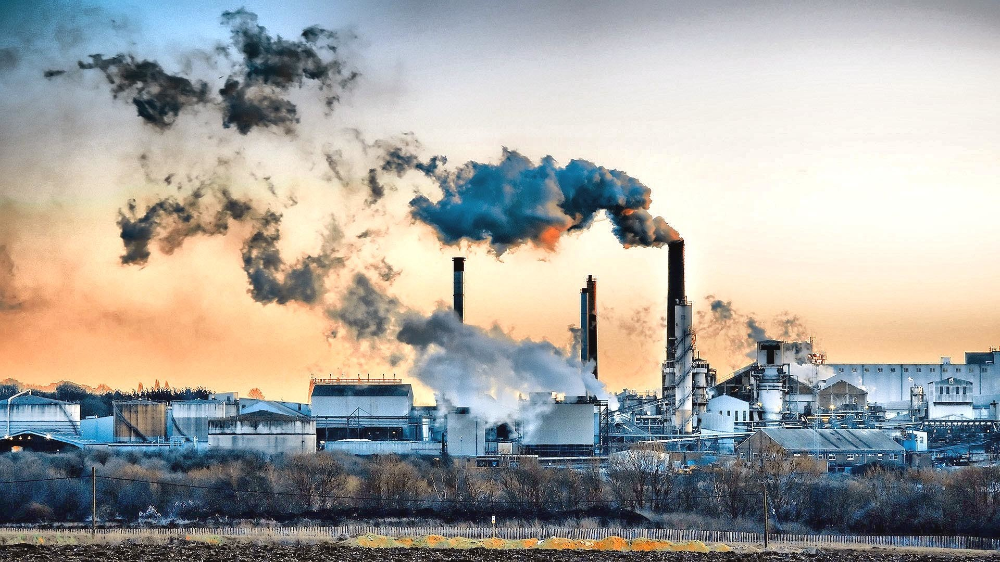

# Importing the Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import tensorflow as tf

# Reading the Dataset

In [2]:
df = pd.read_csv("AirQualityUCI.csv")
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/3/2004,18.00.00,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578
1,10/3/2004,19.00.00,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255
2,10/3/2004,20.00.00,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502
3,10/3/2004,21.00.00,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867
4,10/3/2004,22.00.00,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888


In [3]:
df.shape

(9357, 15)

In [4]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9356.000000
mean,-34.033536,1048.816074,-159.066485,2.004628,894.432724,168.696484,794.910655,58.360372,1391.462755,974.900780,9.782430,39.479397,-6.838464
std,79.096080,330.062067,139.800836,43.568942,342.491834,257.434899,322.147362,128.153143,467.198972,456.996348,43.206308,51.217345,38.978664
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692250
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.500000,0.976800
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296300
max,1428.000000,2040.000000,1189.000000,1321.000000,2214.000000,1479.000000,2683.000000,1779.000000,2775.000000,2523.000000,57.200000,88.700000,2.231000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   float64
 3   PT08.S1(CO)    9357 non-null   int64  
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   float64
 6   PT08.S2(NMHC)  9357 non-null   int64  
 7   NOx(GT)        9357 non-null   int64  
 8   PT08.S3(NOx)   9357 non-null   int64  
 9   NO2(GT)        9357 non-null   int64  
 10  PT08.S4(NO2)   9357 non-null   int64  
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   float64
 13  RH             9357 non-null   float64
 14  AH             9356 non-null   float64
dtypes: float64(7), int64(6), object(2)
memory usage: 1.1+ MB


# Data Cleaning

<AxesSubplot:>

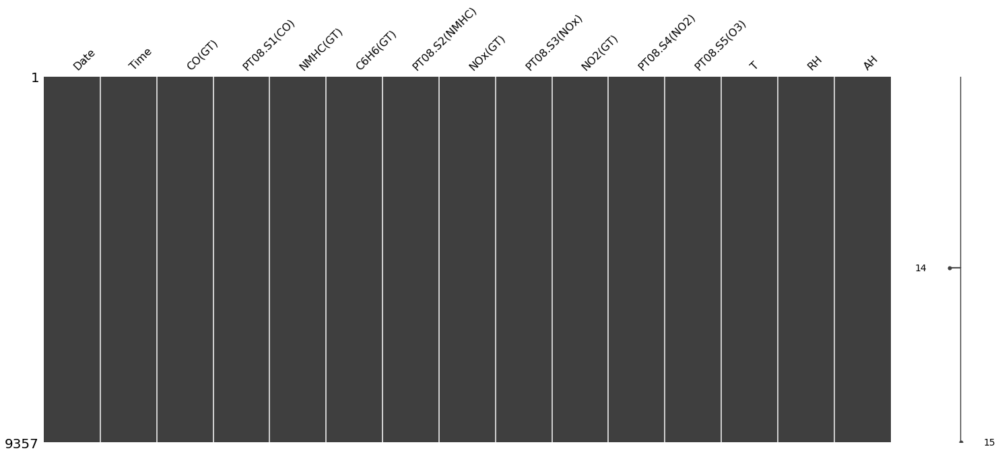

In [6]:
import missingno as m
m.matrix(df)

### Data is already Cleaned

In [7]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/3/2004,18.00.00,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578
1,10/3/2004,19.00.00,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255
2,10/3/2004,20.00.00,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502
3,10/3/2004,21.00.00,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867
4,10/3/2004,22.00.00,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888


# Dropping the ID Column

In [8]:
df = df.drop(columns=['Date','Time'])

In [9]:
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578
1,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255
2,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502
3,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867
4,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888


# Data Visualization

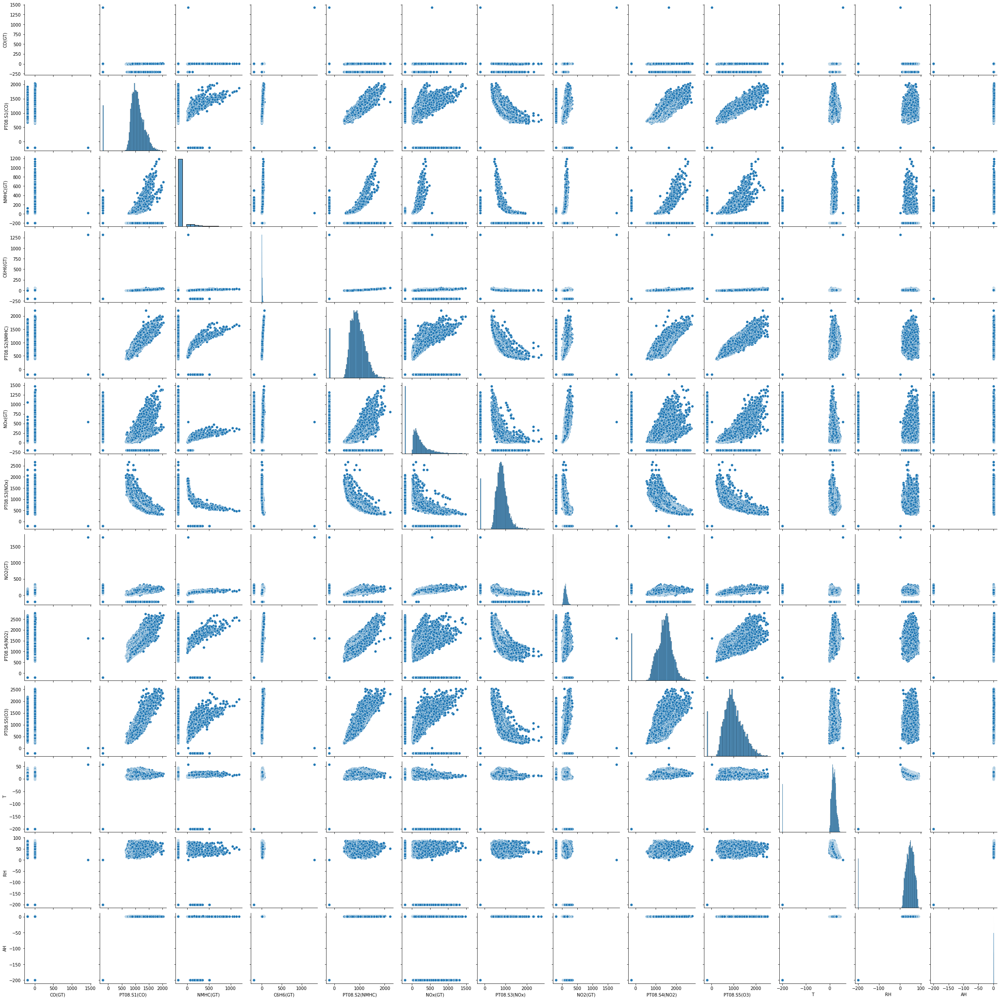

In [10]:
sns.pairplot(df)

In [11]:
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578
1,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255
2,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502
3,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867
4,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888


In [12]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=13)

fig.append_trace(go.Box(
    y=df['CO(GT)'],
    
    name="CO(GT)",
    boxpoints='all',
), row=1, col=1)

fig.append_trace(go.Box(
    y=df['PT08.S1(CO)'],
    
    name="PT08.S1(CO)",
    boxpoints='all',
), row=1, col=2)

fig.append_trace(go.Box(
    y=df['NMHC(GT)'],
    
    name="NMHC(GT)",
    boxpoints='all',
), row=1, col=4)

fig.append_trace(go.Box(
    y=df['C6H6(GT)'],
    
    name="C6H6(GT)",
    boxpoints='all'
), row=1, col=3)

fig.append_trace(go.Box(
    y=df['PT08.S2(NMHC)'],
    
    name="PT08.S2(NMHC)",
    boxpoints='all',
), row=1, col=5)

fig.append_trace(go.Box(
    y=df['NOx(GT)'],
    
    name="NOx(GT)",
    boxpoints='all',
), row=1, col=6)

fig.append_trace(go.Box(
    y=df['PT08.S3(NOx)'],
    
    name="PT08.S3(NOx)",
    boxpoints='all',
), row=1, col=7)

fig.append_trace(go.Box(
    y=df['NO2(GT)'],
    
    name="NO2(GT)",
    boxpoints='all'
), row=1, col=8)

fig.append_trace(go.Box(
    y=df['PT08.S4(NO2)'],
    
    name="PT08.S4(NO2)",
    boxpoints='all'
), row=1, col=9)

fig.append_trace(go.Box(
    y=df['PT08.S5(O3)'],
    
    name="PT08.S5(O3)",
    boxpoints='all'
), row=1, col=10)

fig.append_trace(go.Box(
    y=df['T'],
    
    name="T",
    boxpoints='all'
), row=1, col=11)

fig.append_trace(go.Box(
    y=df['AH'],
    
    name="AH",
    boxpoints='all'
), row=1, col=12)

fig.append_trace(go.Box(
    y=df['RH'],
    
    name="RH",
    boxpoints='all'
), row=1, col=13)

fig.update_layout(title_text="Mega Boxplot",showlegend=False)
fig.show()

In [13]:
import plotly.graph_objects as go



fig = go.Figure()
fig.add_trace(go.Histogram(x=df['PT08.S1(CO)']))
fig.add_trace(go.Histogram(x=df['PT08.S2(NMHC)']))
fig.add_trace(go.Histogram(x=df['PT08.S3(NOx)']))
fig.add_trace(go.Histogram(x=df['PT08.S4(NO2)']))
fig.add_trace(go.Histogram(x=df['PT08.S5(O3)']))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [14]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9356.000000
mean,-34.033536,1048.816074,-159.066485,2.004628,894.432724,168.696484,794.910655,58.360372,1391.462755,974.900780,9.782430,39.479397,-6.838464
std,79.096080,330.062067,139.800836,43.568942,342.491834,257.434899,322.147362,128.153143,467.198972,456.996348,43.206308,51.217345,38.978664
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692250
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.500000,0.976800
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296300
max,1428.000000,2040.000000,1189.000000,1321.000000,2214.000000,1479.000000,2683.000000,1779.000000,2775.000000,2523.000000,57.200000,88.700000,2.231000


# Heatmap

<AxesSubplot:>

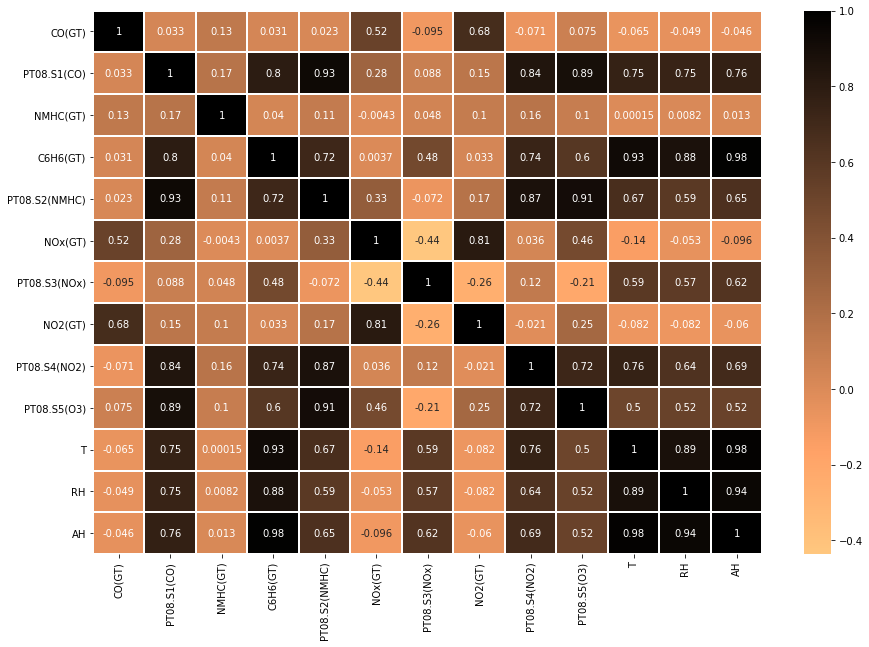

In [15]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot = True, linewidth=1, cmap="copper_r")

# Unlabeled Data

In [16]:
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578
1,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255
2,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502
3,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867
4,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888


In [17]:
df = df.dropna()

# Dendrogram for Determining the K Value

In [18]:
import plotly.figure_factory as ff
fig = ff.create_dendrogram(df)
fig.update_layout(width=1000, height=500)
fig.show()

# Building Model with 3 Clusters

In [19]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(df)

In [20]:
df['clusters'] =  y_hc

# Labeled Data

In [21]:
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,clusters
0,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578,0
1,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255,0
2,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502,0
3,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867,0
4,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888,0


# Replacing the Labels with Cluster Name

In [22]:
df['clusters'] = df['clusters'].replace([0],'Cluster 1')
df['clusters'] = df['clusters'].replace([1],'Cluster 2')
df['clusters'] = df['clusters'].replace([2],'Cluster 3')

In [23]:
fig = px.scatter_3d(df, x='PT08.S2(NMHC)', y='PT08.S1(CO)', z='NOx(GT)',title="Before K-Means Clustering")              
fig.show()

In [24]:
fig = px.scatter_3d(df, x='PT08.S2(NMHC)', y='PT08.S1(CO)', z='NOx(GT)', color='clusters',title="After K-Means Clustering")              
fig.show()

In [25]:
fig = px.scatter_3d(df, x='NOx(GT)', y='PT08.S3(NOx)', z='NO2(GT)',title="Before K-Means Clustering")              
fig.show()

In [26]:
fig = px.scatter_3d(df, x='NOx(GT)', y='PT08.S3(NOx)', z='NO2(GT)', color='clusters',title="After K-Means Clustering")              
fig.show()

In [27]:
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,clusters
0,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578,Cluster 1
1,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255,Cluster 1
2,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502,Cluster 1
3,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867,Cluster 1
4,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888,Cluster 1


# Replacing the Cluster Names
####    Cluster 1 - Bad
####    Cluster 2 - Good
####    Cluster 3 - Medium

In [28]:
df['clusters'] = df['clusters'].replace(['Cluster 2'],'Good')

df['clusters'] = df['clusters'].replace(['Cluster 1'],'Bad')

df['clusters'] = df['clusters'].replace(['Cluster 3'],'Medium')

# Renaming the Column name Clusters to Designation

In [29]:
df = df.rename(columns={'clusters': 'State'})

In [30]:
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,State
0,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578,Bad
1,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255,Bad
2,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502,Bad
3,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867,Bad
4,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888,Bad


In [31]:
df.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH', 'State'],
      dtype='object')

In [32]:
df.shape

(9356, 14)

# Making Dummy Variables of State Column

In [33]:
df1 = pd.get_dummies(df['State'])

In [34]:
df1.head()

,Bad,Good,Medium
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0


# X and y Split


In [35]:
X = df[['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH']].values
y = df1.values

In [36]:
X

array([[ 2.600e+00,  1.360e+03,  1.500e+02, ...,  1.360e+01,  4.890e+01,
         7.578e-01],
       [ 2.000e+00,  1.292e+03,  1.120e+02, ...,  1.330e+01,  4.770e+01,
         7.255e-01],
       [ 2.200e+00,  1.402e+03,  8.800e+01, ...,  1.190e+01,  5.400e+01,
         7.502e-01],
       ...,
       [ 2.400e+00,  1.142e+03, -2.000e+02, ...,  2.690e+01,  1.830e+01,
         6.406e-01],
       [ 2.100e+00,  1.003e+03, -2.000e+02, ...,  2.830e+01,  1.350e+01,
         5.139e-01],
       [ 2.200e+00,  1.071e+03, -2.000e+02, ...,  2.850e+01,  1.310e+01,
         5.028e-01]])

In [37]:
y

array([[1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       ...,
       [1, 0, 0],
       [0, 0, 1],
       [1, 0, 0]], dtype=uint8)

# Train Test Split

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Feature Scaling 

In [39]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Building ANN Model with 10 Hidden Layers

In [40]:
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=14, activation='relu'))
ann.add(tf.keras.layers.Dense(units=40, activation='relu'))
ann.add(tf.keras.layers.Dense(units=150, activation='relu'))
ann.add(tf.keras.layers.Dense(units=200, activation='relu'))
ann.add(tf.keras.layers.Dense(units=50, activation='relu'))
ann.add(tf.keras.layers.Dense(units=100, activation='relu'))
ann.add(tf.keras.layers.Dense(units=400, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=3, activation='sigmoid'))

## Compiling the Model with ADAM Optimizer and Binary Crossentropy Loss Function

In [41]:
ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting the Dataset Into Model

In [42]:
history = ann.fit(X_train, y_train, batch_size = 32, validation_data=(X_test,y_test) ,epochs = 100)

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
220/234 [===========================>..] - ETA: 0s - loss: 0.1565 - accuracy: 0.8898WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000001B58B766378> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10

234/234 [==============================] - 1s 3ms/step - loss: 0.0123 - accuracy: 0.9928 - val_loss: 0.0362 - val_accuracy: 0.9856
Epoch 45/100
234/234 [==============================] - 1s 3ms/step - loss: 0.0126 - accuracy: 0.9932 - val_loss: 0.0489 - val_accuracy: 0.9808
Epoch 46/100
234/234 [==============================] - 1s 3ms/step - loss: 0.0118 - accuracy: 0.9932 - val_loss: 0.0376 - val_accuracy: 0.9813
Epoch 47/100
234/234 [==============================] - 1s 3ms/step - loss: 0.0113 - accuracy: 0.9936 - val_loss: 0.0404 - val_accuracy: 0.9824
Epoch 48/100
234/234 [==============================] - 1s 3ms/step - loss: 0.0126 - accuracy: 0.9935 - val_loss: 0.0398 - val_accuracy: 0.9818
Epoch 49/100
234/234 [==============================] - 1s 3ms/step - loss: 0.0129 - accuracy: 0.9928 - val_loss: 0.0352 - val_accuracy: 0.9845
Epoch 50/100
234/234 [==============================] - 1s 3ms/step - loss: 0.0119 - accuracy: 0.9933 - val_loss: 0.0376 - val_accuracy: 0.9824
Epoch

In [43]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


# Accuracy vs Validation Accuracy Plot

In [44]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(y=history.history['accuracy'], name='Accuracy',
                         line=dict(color='royalblue', width=5)))
fig.add_trace(go.Scatter(y=history.history['val_accuracy'], name = 'Validation Accuracy',
                         line=dict(color='firebrick', width=5)))

# Loss vs Validation Loss Plot


In [45]:
fig = go.Figure()

fig.add_trace(go.Scatter(y=history.history['loss'], name='Loss',
                         line=dict(color='royalblue', width=5)))
fig.add_trace(go.Scatter(y=history.history['val_loss'], name = 'Validation Loss',
                         line=dict(color='firebrick', width=5)))

# Prediction on Test Set

In [46]:
y_pred = ann.predict(X_test)
y_pred = (y_pred > 0.5)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [47]:
y_pred = np.where(y_pred == 'False',0, y_pred)

C:\Users\KIIT\Anaconda3\envs\python 36 with tensorflow\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [48]:
y_pred, y_test

(array([[0, 0, 1],
        [0, 0, 1],
        [0, 0, 1],
        ...,
        [0, 1, 0],
        [0, 0, 1],
        [0, 0, 1]]),
 array([[0, 0, 1],
        [0, 0, 1],
        [0, 0, 1],
        ...,
        [0, 1, 0],
        [0, 0, 1],
        [0, 0, 1]], dtype=uint8))

# Accuracy

In [49]:
from sklearn.metrics import accuracy_score
print("Accuracy : ",accuracy_score(y_test, y_pred))

Accuracy :  0.9818376068376068


# Classification Report

In [50]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1115
           1       1.00      1.00      1.00        75
           2       0.97      0.98      0.98       682

   micro avg       0.98      0.98      0.98      1872
   macro avg       0.99      0.99      0.99      1872
weighted avg       0.98      0.98      0.98      1872
 samples avg       0.98      0.98      0.98      1872



C:\Users\KIIT\Anaconda3\envs\python 36 with tensorflow\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.



# Initially I have a Unlabeled Dataset 
# Applied Dendrogram and Found out the K Value
# Performed Agglomerative Clustering and got Clustered Data
# Converted The Clustered Data into Proper Label
# Split the dataset into X and y, then Train test 
# Performed 10 Layer ANN Architecture to Classify 
# At the End Model can Classify the Air Quality with an Accuracy of 98%